In [1]:
import os
import matplotlib.pylab as plt
from glob import glob
import numpy as np
import math

import random

from PIL import Image

In [2]:
PATH = os.path.abspath('.')

name = "2018-11-30-12-58-17_sunny"
# name = "kia_mppi_2018-09-06-15-53-35_до_МЧС"
# name = "kia_mppi_2018-09-07-15-09-11_2_succes_turn"

SOURCE_IMAGES = [os.path.join(PATH, "data/images/"+name)]

images = []

for si in SOURCE_IMAGES:
    images.extend(glob(os.path.join(si, "*.png")))
    
print("Datasets used: {}\n".format(SOURCE_IMAGES))

images.sort()

Datasets used: ['/home/kenny/Desktop/lanes-segmentation/data/images/2018-11-30-12-58-17_sunny']



In [3]:
print(np.size(images))

643


In [4]:
def crop(x, crop_h=320, crop_w=1152):
    h,w = x.shape[:2]
    
    h_offset = 0 #pixels
    
    h_new = h-(crop_h+h_offset), h-h_offset
    w_new = int(math.floor((w-crop_w)/2.)), int(math.floor(w-(w-crop_w)/2.))
    return x[h_new[0]:h_new[1], w_new[0]:w_new[1], :]

In [5]:
def get_image(path):
    
    aspect_ratio = 2.5
    
    image = Image.open(path)
    image = image.resize((1152,int(1152/aspect_ratio)))
        
    return(np.asarray(image))

(460, 1152, 3)
uint8


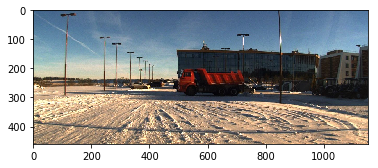

In [6]:
img = get_image(images[0])

print(img.shape)
print(img.dtype)

plt.imshow(img)

In [ ]:
images = images[:10]

In [ ]:
from models.Unet import unet

model = unet(input_size = (320,1152,3), n_classes=2)

print("Model summary:")
# model.summary()

# In[ ]:
from keras import optimizers

#model.compile(optimizer = 'adadelta', loss = 'categorical_crossentropy', metrics = ['accuracy'])

learning_rate = 1e-4
optimizer = optimizers.Adam(lr = learning_rate)
loss = 'binary_crossentropy'
metrics = ['accuracy']

print("Optimizer: {}, learning rate: {}, loss: {}, metrics: {}\n".format(optimizer, learning_rate, loss, metrics))

model.compile(optimizer = optimizer, loss = loss, metrics = metrics)

# model.load_weights('weights/egolane/2018-11-23 11-22-58.hdf5')
model.load_weights("weights/road/2018-11-23 13-41-05.hdf5")

In [ ]:
y_pred = np.zeros([len(images), 320, 1152, 2], dtype=np.float32)

for i,im in enumerate(images):
        
    img = get_image(im)
    img = crop(img)
    img = np.expand_dims(img, axis=0)

    y_pred[i] = model.predict(img, batch_size=1, verbose=1)

In [7]:
y_pred = np.load("results/"+name+".npy")

In [8]:
np.array(y_pred[n], dtype=np.uint8)

NameError: name 'n' is not defined

In [ ]:
np.unique(np.argmax(y_pred))

In [ ]:
plt.imshow(crop(get_image(images[0])))

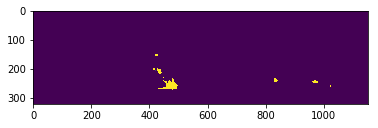

In [11]:
plt.imshow(y_pred[8])

In [12]:
import webcolors

def colorize(mask):
    hex_colors = ['#ffffff', '#ff0000']

    rgb_colors = []

    for hex_color in hex_colors:
        rgb_colors.append(webcolors.hex_to_rgb(hex_color))
        
    colors = np.array(rgb_colors)
        
    colorMask = np.zeros([mask.shape[0], mask.shape[1], 3],dtype=np.uint8)
    for r in range(mask.shape[0]):
        for c in range(mask.shape[1]):
            colorMask[r,c,] = colors[mask[r,c]]

    return colorMask

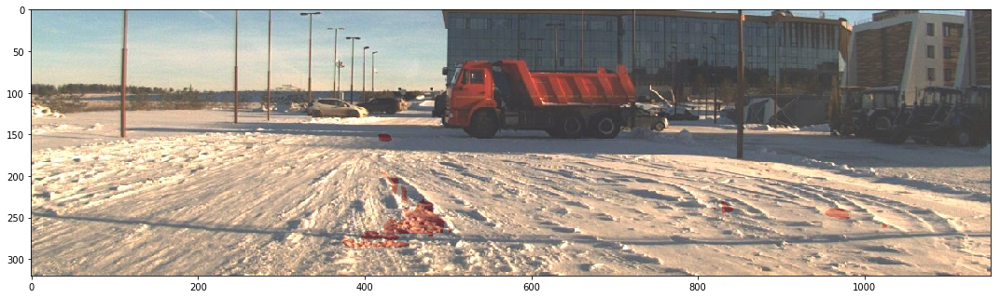

In [13]:
n = 0

a = Image.fromarray(crop(get_image(images[n])))
b = Image.fromarray(colorize(np.array(y_pred[n], dtype=np.uint8)))

fig, axes = plt.subplots(nrows=1, ncols=1)
fig.set_size_inches(15,10)
axes.imshow(a)
axes.imshow(b, alpha=0.2)
fig.tight_layout()

/home/kenny/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


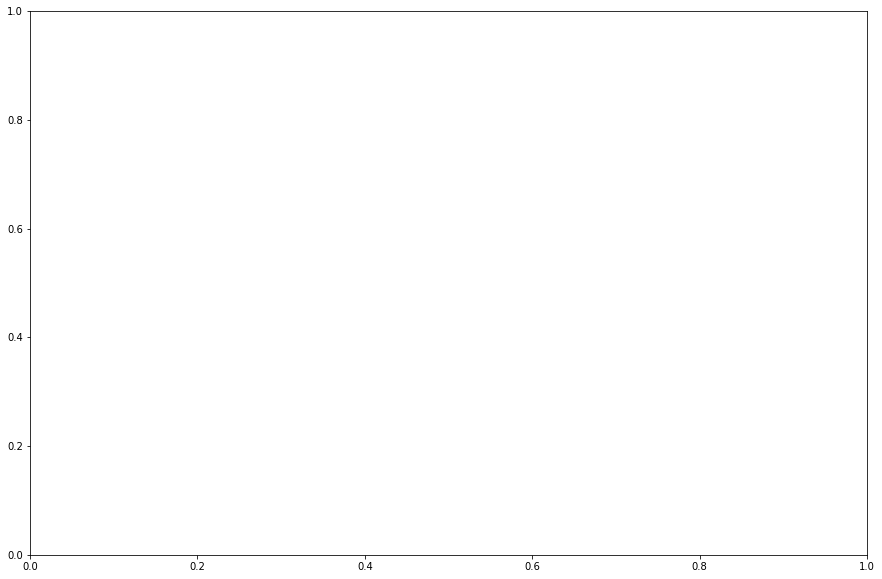

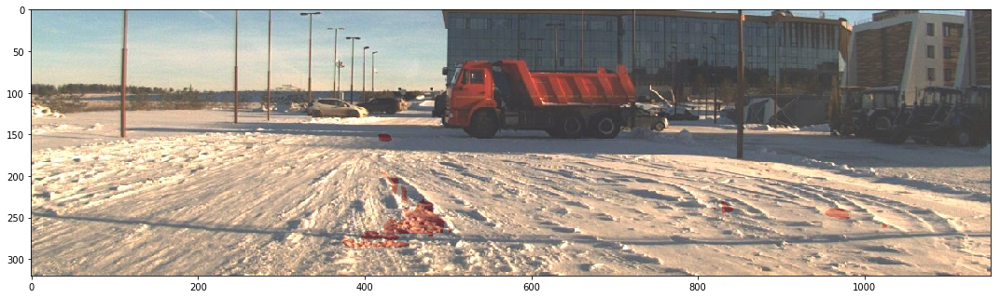

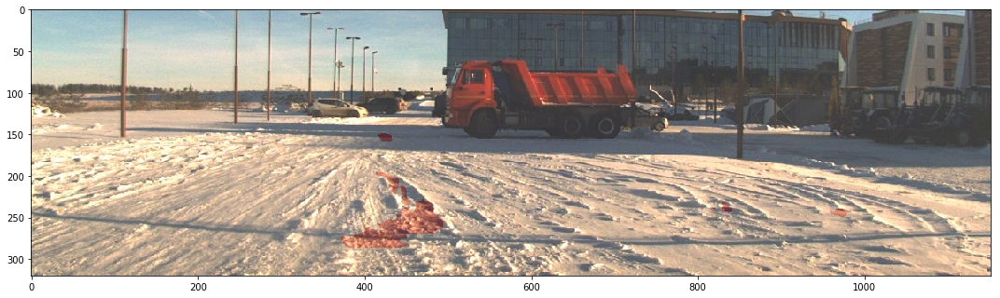

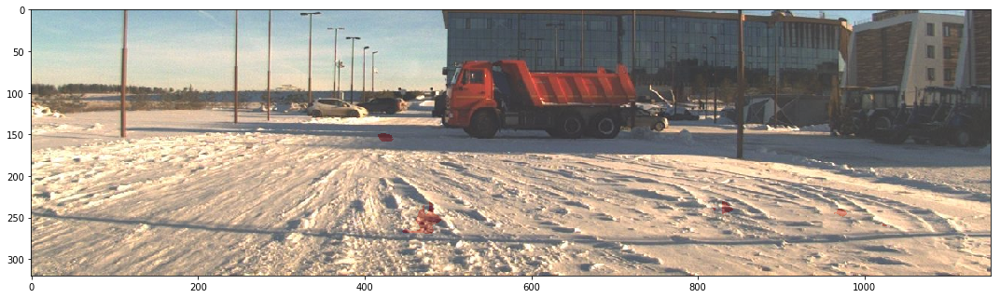

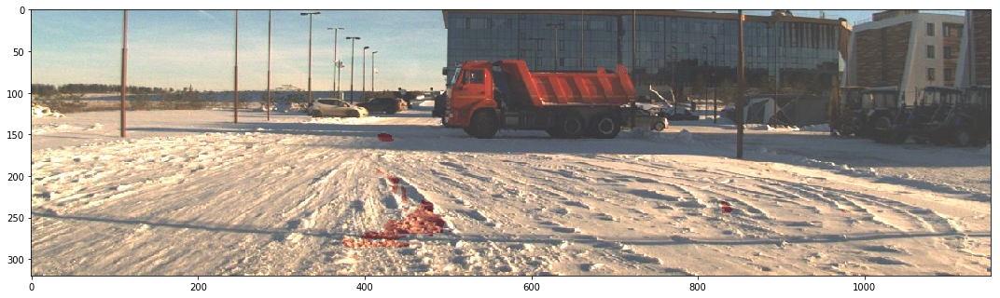

...

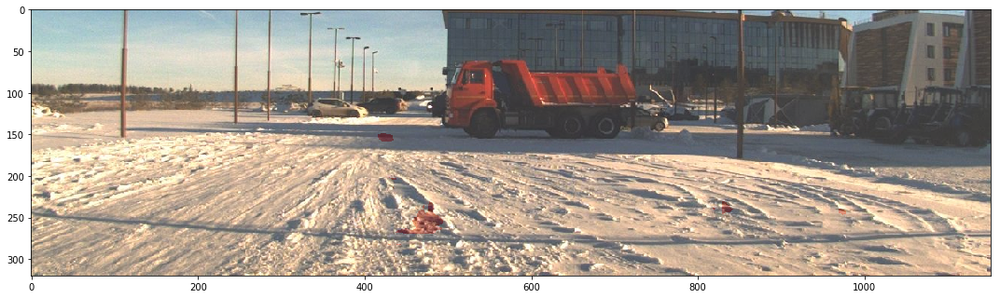

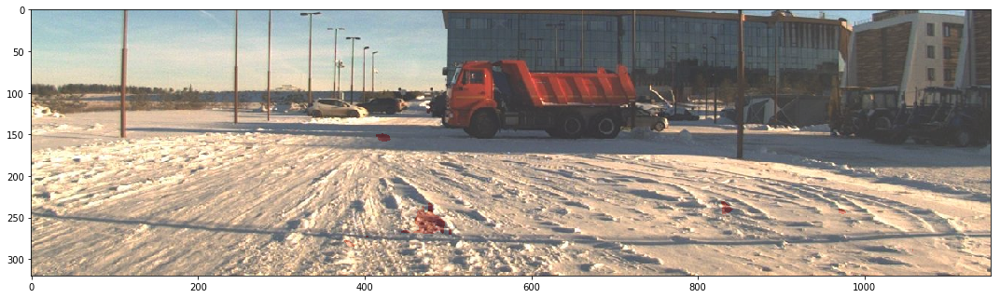

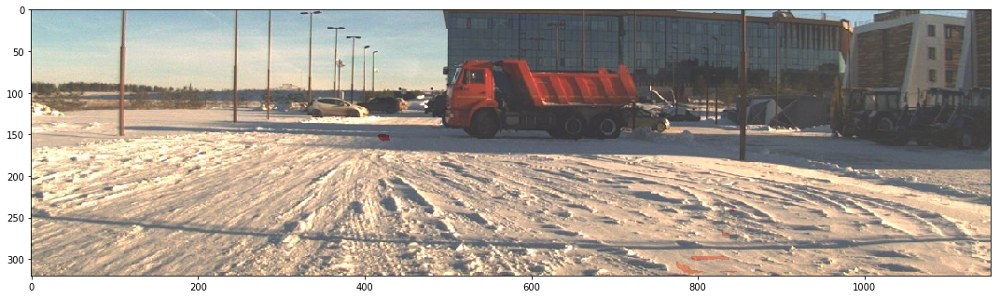

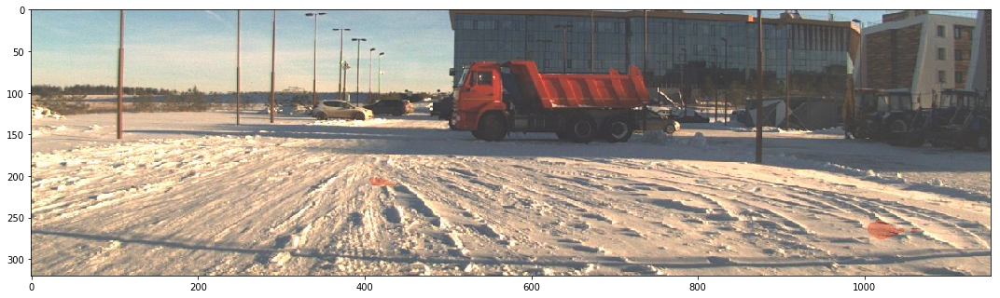

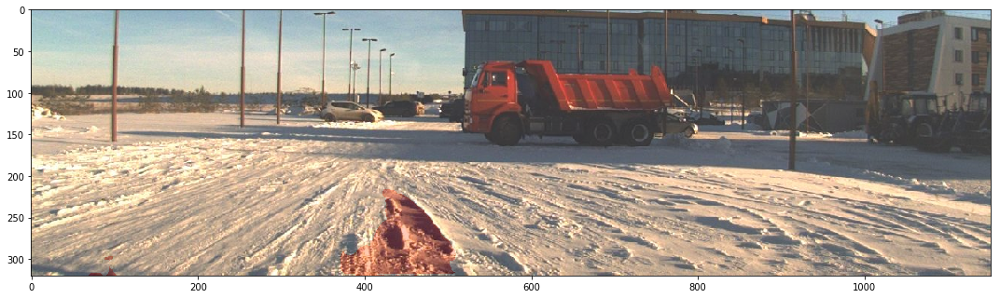

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1)
fig.set_size_inches(15,10)
for i in range(len(images)):
    a = Image.fromarray(crop(get_image(images[i])))
    b = Image.fromarray(colorize(np.array(y_pred[i], dtype=np.uint8)))

    fig, axes = plt.subplots(nrows=1, ncols=1)
    fig.set_size_inches(15,10)
    axes.imshow(a)
    axes.imshow(b, alpha=0.2)
    fig.tight_layout()
    fig.savefig("results/kia/"+name+"/img{}.png".format(i))